In [1]:
# Importing all the necessary libraries for the project
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array, array_to_img
import keras
from tensorflow.keras.metrics import AUC, TruePositives, TrueNegatives, FalsePositives, FalseNegatives, Accuracy, CategoricalAccuracy
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau


#Open image using Image module
from PIL import Image

# importing the 'zipfile' module
import zipfile
 

# Load the TensorBoard notebook extensions
%load_ext tensorboard
from tensorboard.plugins.hparams import api as hp

# Set seed to 42 to have similar results
import random as python_random
import random
np.random.seed(42)
python_random.seed(42)
tf.random.set_seed(42)

# Use scikit-learn to get statistics
import sklearn.metrics as metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# importing seaborn and matplotlib for statistical data visualization
import seaborn as sn
import matplotlib.pyplot as plt

# importing shutil module
import shutil
from shutil import copyfile

# importing os module
import os
from os import getcwd

import nltk
import pickle

from tensorflow.keras.utils import plot_model


In [2]:
# Clear any logs from previous runs
#!rm -rf ./logs/

In [3]:
# Show tensorflow version
print(tf.__version__)
 
# check GPU version of tensorflow
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

2.5.0
Tue Aug 10 02:22:20 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P0    31W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-

# Authenticating with Kaggle using kaggle.json





In [4]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 67 bytes


In [5]:
!kaggle datasets download "tawsifurrahman/covid19-radiography-database"

 99% 739M/745M [00:06<00:00, 128MB/s]
100% 745M/745M [00:06<00:00, 124MB/s]


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Processing

In [7]:
local_zip = '/content/covid19-radiography-database.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/covid19-radiography-database')

zip_ref.close()

In [8]:
print(len(os.listdir('/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID')))
print(len(os.listdir('/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity')))
print(len(os.listdir('/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal')))
print(len(os.listdir('/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Viral Pneumonia')))



3616
6012
10192
1345


In [9]:
# Use os.mkdir to create your directories
# You will need a directory for cats-v-dogs, and subdirectories for training
# and testing. These in turn will need subdirectories for 'cats' and 'dogs'
try:
    os.mkdir('/COVID-19_Radiography_Dataset')
    os.mkdir('/COVID-19_Radiography_Dataset/training')
    os.mkdir('/COVID-19_Radiography_Dataset/training/COVID')
    os.mkdir('/COVID-19_Radiography_Dataset/training/Normal')
    os.mkdir('/COVID-19_Radiography_Dataset/training/Lung_Opacity')
    os.mkdir('/COVID-19_Radiography_Dataset/training/Viral Pneumonia')
    os.mkdir('/COVID-19_Radiography_Dataset/testing')
    os.mkdir('/COVID-19_Radiography_Dataset/testing/COVID')
    os.mkdir('/COVID-19_Radiography_Dataset/testing/Normal')
    os.mkdir('/COVID-19_Radiography_Dataset/testing/Lung_Opacity')
    os.mkdir('/COVID-19_Radiography_Dataset/testing/Viral Pneumonia')
    
except OSError:
    pass

In [10]:
def split_data(SOURCE, TRAINING, TESTING, SPLIT_SIZE):
  files = []
  for filename in os.listdir(SOURCE):
    file = SOURCE + filename
    if os.path.getsize(file) > 0:
        files.append(filename)
    else:
        print(filename + " is zero length, so ignoring.")

  training_length = int(len(files) * SPLIT_SIZE)
  testing_length = int(len(files) - training_length)
  shuffled_set = random.sample(files, len(files))
  training_set = shuffled_set[0:training_length]
  testing_set = shuffled_set[:testing_length]

  for filename in training_set:
      this_file = SOURCE + filename
      destination = TRAINING + filename
      copyfile(this_file, destination)

  for filename in testing_set:
      this_file = SOURCE + filename
      destination = TESTING + filename
      copyfile(this_file, destination)


COVID_SOURCE_DIR = "/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/COVID/"
TRAINING_COVID_DIR = "/COVID-19_Radiography_Dataset/training/COVID/"
TESTING_COVID_DIR = "/COVID-19_Radiography_Dataset/testing/COVID/"

Normal_SOURCE_DIR = "/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Normal/"
TRAINING_Normal_DIR = "/COVID-19_Radiography_Dataset/training/Normal/"
TESTING_Normal_DIR = "/COVID-19_Radiography_Dataset/testing/Normal/"

Lung_Opacity_SOURCE_DIR = "/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Lung_Opacity/"
TRAINING_Lung_Opacity_DIR = "/COVID-19_Radiography_Dataset/training/Lung_Opacity/"
TESTING_Lung_Opacity_DIR = "/COVID-19_Radiography_Dataset/testing/Lung_Opacity/"

Pneumonia_SOURCE_DIR = "/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset/Viral Pneumonia/"
TRAINING_Pneumonia_DIR = "/COVID-19_Radiography_Dataset/training/Viral Pneumonia/"
TESTING_Pneumonia_DIR = "/COVID-19_Radiography_Dataset/testing/Viral Pneumonia/"

split_size = .75
split_data(COVID_SOURCE_DIR, TRAINING_COVID_DIR, TESTING_COVID_DIR, split_size)
split_data(Normal_SOURCE_DIR, TRAINING_Normal_DIR, TESTING_Normal_DIR, split_size)
split_data(Lung_Opacity_SOURCE_DIR, TRAINING_Lung_Opacity_DIR, TESTING_Lung_Opacity_DIR, split_size)
split_data(Pneumonia_SOURCE_DIR, TRAINING_Pneumonia_DIR, TESTING_Pneumonia_DIR, split_size)

In [11]:
print('total training COVID images:',len(os.listdir('/COVID-19_Radiography_Dataset/training/COVID/')))
print('total training Normal images:',len(os.listdir('/COVID-19_Radiography_Dataset/training/Normal/')))
print('total training Lung Opacity images:',len(os.listdir('/COVID-19_Radiography_Dataset/training/Lung_Opacity/')))
print('total training Viral Pneumonia images:',len(os.listdir('/COVID-19_Radiography_Dataset/training/Viral Pneumonia/')))


print('total validation COVID images:',len(os.listdir('/COVID-19_Radiography_Dataset/testing/COVID/')))
print('total validation Normal images:',len(os.listdir('/COVID-19_Radiography_Dataset/testing/Normal/')))
print('total validation Lung Opacity images:',len(os.listdir('/COVID-19_Radiography_Dataset/testing/Lung_Opacity/')))
print('total validation Viral Pneumonia images:',len(os.listdir('/COVID-19_Radiography_Dataset/testing/Viral Pneumonia/')))

total training COVID images: 2712
total training Normal images: 7644
total training Lung Opacity images: 4509
total training Viral Pneumonia images: 1008
total validation COVID images: 904
total validation Normal images: 2548
total validation Lung Opacity images: 1503
total validation Viral Pneumonia images: 337


In [12]:
train_COVID_names = os.listdir(TRAINING_COVID_DIR)
print(train_COVID_names[:10])

train_Normal_names = os.listdir(TRAINING_Normal_DIR)
print(train_Normal_names[:10])

train_Lung_Opacity_names = os.listdir(TRAINING_Lung_Opacity_DIR)
print(train_Lung_Opacity_names[:10])

train_Pneumonia_names = os.listdir(TRAINING_Pneumonia_DIR)
print(train_Pneumonia_names[:10])



validation_COVID_hames = os.listdir(TESTING_COVID_DIR)
print(validation_COVID_hames[:10])

validation_Normal_names = os.listdir(TESTING_Normal_DIR)
print(validation_Normal_names[:10])

validation_Lung_Opacity_hames = os.listdir(TESTING_Lung_Opacity_DIR)
print(validation_Lung_Opacity_hames[:10])

validation_Pneumonia_names = os.listdir(TESTING_Pneumonia_DIR)
print(validation_Pneumonia_names[:10])

['COVID-649.png', 'COVID-3389.png', 'COVID-2388.png', 'COVID-154.png', 'COVID-1610.png', 'COVID-1604.png', 'COVID-2696.png', 'COVID-1359.png', 'COVID-430.png', 'COVID-1261.png']
['Normal-8741.png', 'Normal-3845.png', 'Normal-7453.png', 'Normal-10030.png', 'Normal-4415.png', 'Normal-9232.png', 'Normal-8302.png', 'Normal-10014.png', 'Normal-2627.png', 'Normal-5014.png']
['Lung_Opacity-1393.png', 'Lung_Opacity-4219.png', 'Lung_Opacity-4841.png', 'Lung_Opacity-5378.png', 'Lung_Opacity-2564.png', 'Lung_Opacity-5435.png', 'Lung_Opacity-5842.png', 'Lung_Opacity-795.png', 'Lung_Opacity-2572.png', 'Lung_Opacity-2193.png']
['Viral Pneumonia-219.png', 'Viral Pneumonia-859.png', 'Viral Pneumonia-655.png', 'Viral Pneumonia-657.png', 'Viral Pneumonia-332.png', 'Viral Pneumonia-784.png', 'Viral Pneumonia-1109.png', 'Viral Pneumonia-106.png', 'Viral Pneumonia-1168.png', 'Viral Pneumonia-744.png']
['COVID-649.png', 'COVID-3389.png', 'COVID-1610.png', 'COVID-1604.png', 'COVID-430.png', 'COVID-1261.png',

In [13]:
TRAINING_DIR = "/COVID-19_Radiography_Dataset/training"
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range = 20,
      zoom_range = 0.2,
      shear_range = 0.2,
      # featurewise_center = True,
      # featurewise_std_normalization = True,
      width_shift_range = 0,
      height_shift_range = 0,
      vertical_flip = False,
      fill_mode = 'nearest'
      )

train_generator = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=32,
                                                    class_mode='categorical',
                                                    target_size=(224,224))

VALIDATION_DIR = "/COVID-19_Radiography_Dataset/testing"
validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                         batch_size=32,
                                                         class_mode  = 'categorical',
                                                         target_size = (224,224))

Found 15873 images belonging to 4 classes.
Found 5292 images belonging to 4 classes.


# Visualization 

In [14]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 8

# Index for iterating over images
pic_index = 0

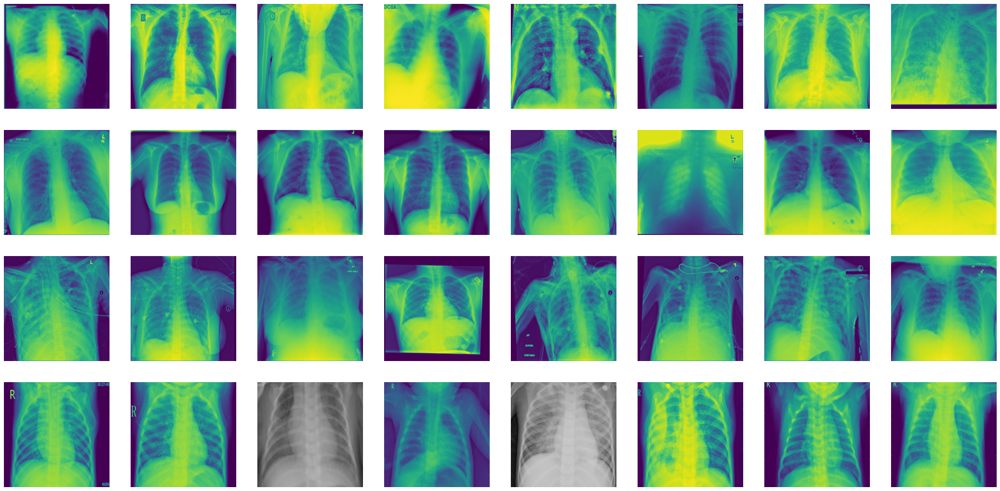

In [15]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_covid_pix = [os.path.join(TRAINING_COVID_DIR, fname) 
                for fname in train_COVID_names[pic_index-8:pic_index]]
next_normal_pix = [os.path.join(TRAINING_Normal_DIR, fname) 
                for fname in train_Normal_names[pic_index-8:pic_index]]
next_lung_pix = [os.path.join(TRAINING_Lung_Opacity_DIR, fname) 
                for fname in train_Lung_Opacity_names[pic_index-8:pic_index]]
next_pneumonia_pix = [os.path.join(TRAINING_Pneumonia_DIR, fname) 
                for fname in train_Pneumonia_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_covid_pix+next_normal_pix+next_lung_pix+next_pneumonia_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)

  plt.imshow(img)

plt.show()

Found 15873 files belonging to 4 classes.


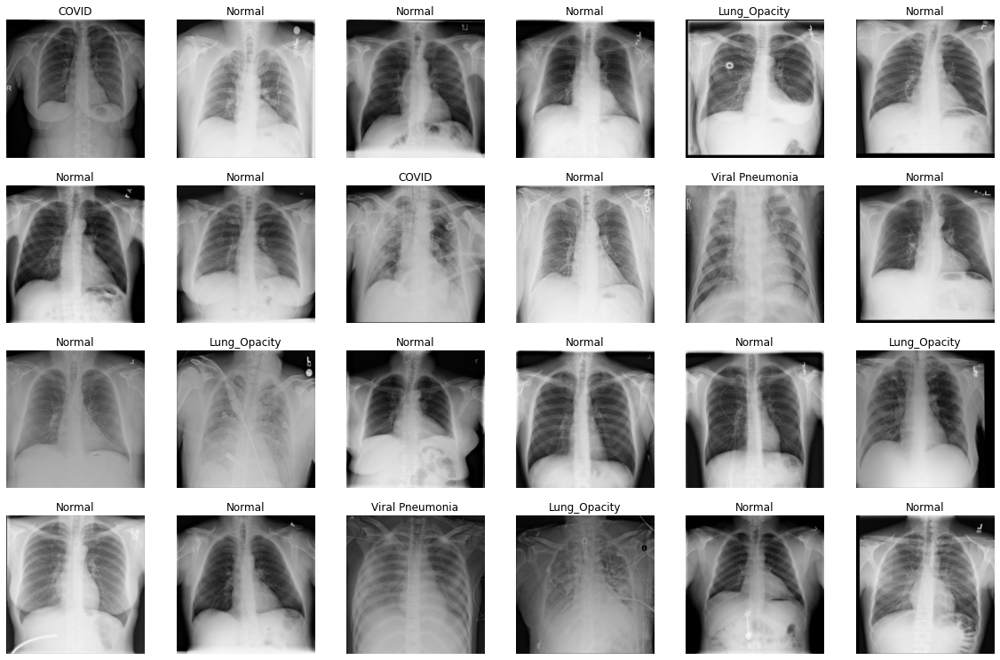

In [16]:
# Assign the training dataset to training set to explore the data
visualization_set = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR,
    seed=1337,
    image_size=(224,224),
    batch_size=126,
)

# Find and show classes
class_names = visualization_set.class_names


# Exploer classes
plt.figure(figsize=(20, 20))
for images, labels in visualization_set.take(1):
  for i in range(24):
    ax = plt.subplot(6, 6, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

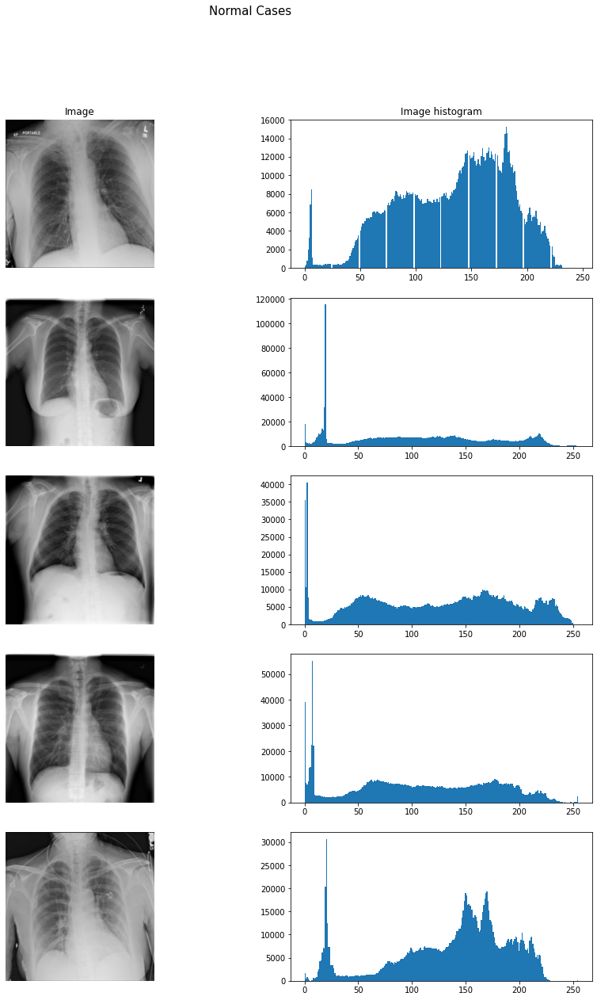

In [17]:
number_images= 5

fig, axs = plt.subplots(number_images, 2, figsize=(15, 20))
for idx, img_name in enumerate(next_normal_pix):
    # Plot image
    if idx == number_images:
      break
    img_path = os.path.join(TRAINING_Normal_DIR, img_name)
    img = load_img(img_path)
    img = img.resize((700, 700))
    axs[idx, 0].imshow(img)
    axs[idx, 0].axis('off')
    # Plot image histogram
    img_arr = img_to_array(img)
    axs[idx, 1].hist(img_arr.ravel(), 256)

axs[0, 0].set_title('Image')    
axs[0, 1].set_title('Image histogram')
fig.suptitle('Normal Cases', size = 15)
plt.show()

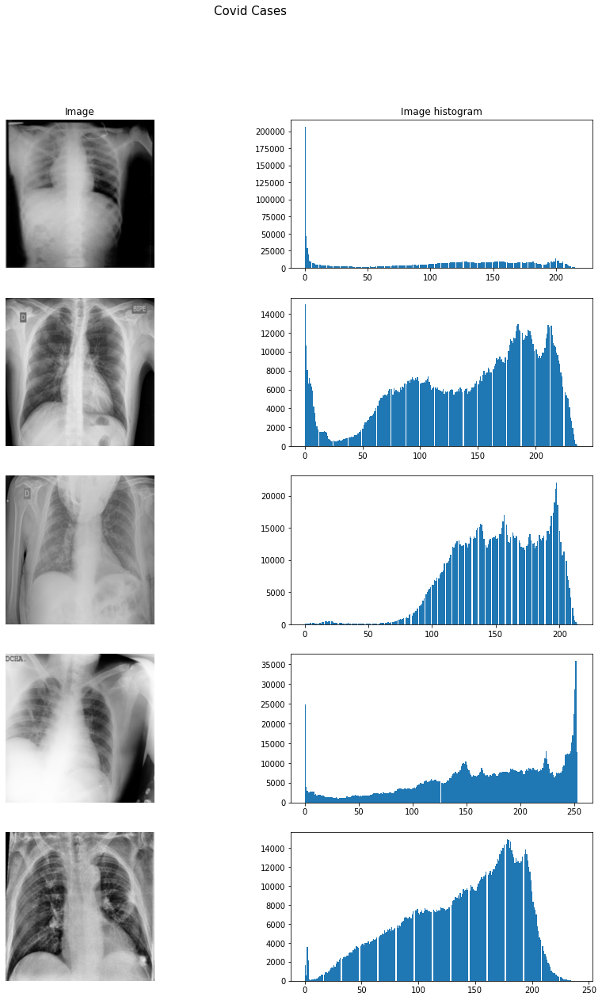

In [18]:
number_images= 5

fig, axs = plt.subplots(number_images, 2, figsize=(15, 20))
for idx, img_name in enumerate(next_covid_pix):
    # Plot image
    if idx == number_images:
      break
    img_path = os.path.join(TRAINING_COVID_DIR, img_name)
    img = load_img(img_path)
    img = img.resize((700, 700))
    axs[idx, 0].imshow(img)
    axs[idx, 0].axis('off')
    # Plot image histogram
    img_arr = img_to_array(img)
    axs[idx, 1].hist(img_arr.ravel(), 256)

axs[0, 0].set_title('Image')    
axs[0, 1].set_title('Image histogram')
fig.suptitle('Covid Cases', size = 15)
plt.show()

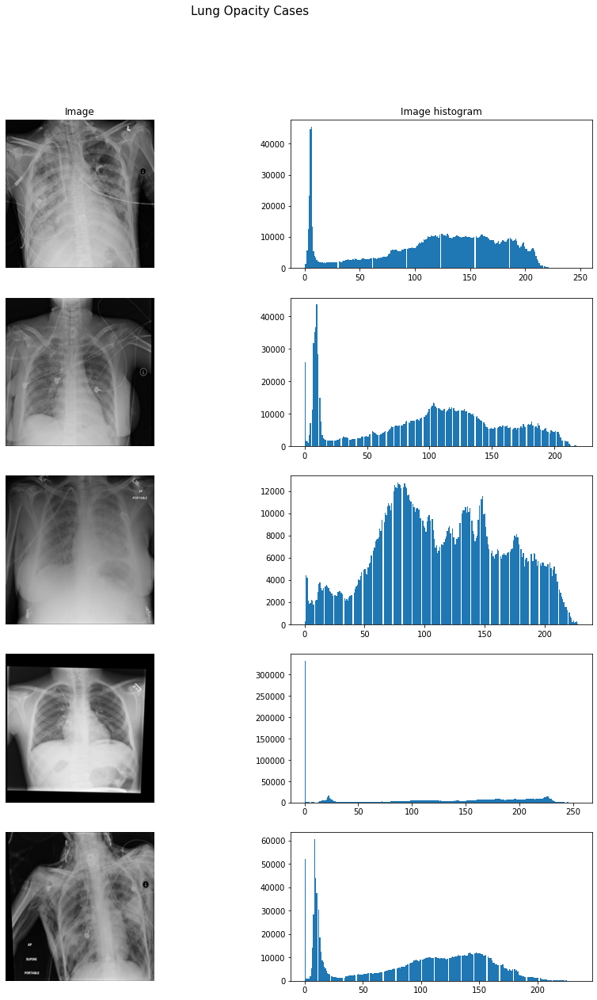

In [19]:
number_images= 5

fig, axs = plt.subplots(number_images, 2, figsize=(15, 20))
for idx, img_name in enumerate(next_lung_pix):
    # Plot image
    if idx == number_images:
      break
    img_path = os.path.join(TRAINING_Lung_Opacity_DIR, img_name)
    img = load_img(img_path)
    img = img.resize((700, 700))
    axs[idx, 0].imshow(img)
    axs[idx, 0].axis('off')
    # Plot image histogram
    img_arr = img_to_array(img)
    axs[idx, 1].hist(img_arr.ravel(), 256)

axs[0, 0].set_title('Image')    
axs[0, 1].set_title('Image histogram')
fig.suptitle('Lung Opacity Cases', size = 15)
plt.show()

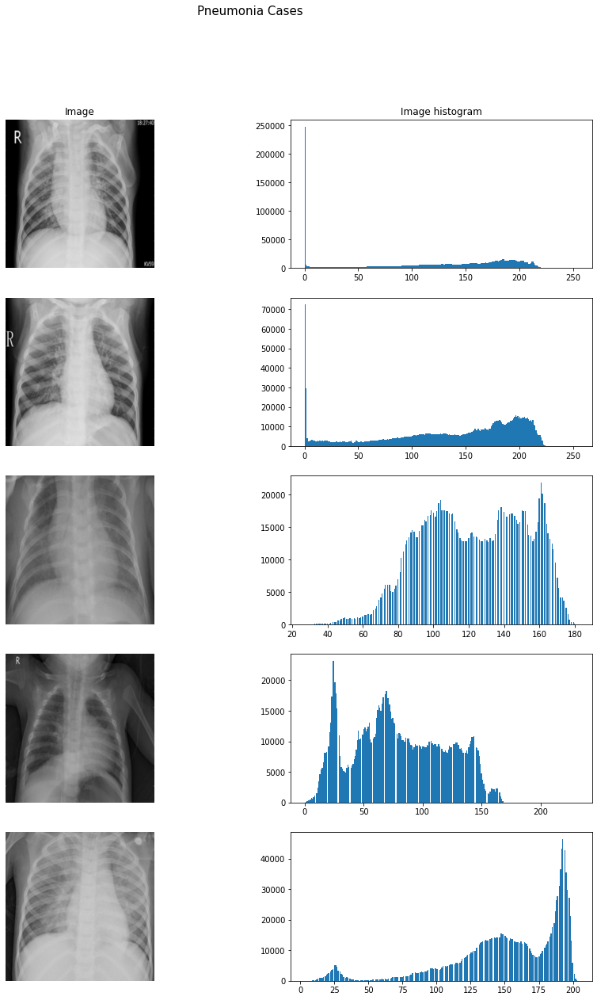

In [20]:
number_images= 5

fig, axs = plt.subplots(number_images, 2, figsize=(15, 20))
for idx, img_name in enumerate(next_pneumonia_pix):
    # Plot image
    if idx == number_images:
      break
    img_path = os.path.join(TRAINING_Pneumonia_DIR, img_name)
    img = load_img(img_path)
    img = img.resize((700, 700))
    axs[idx, 0].imshow(img)
    axs[idx, 0].axis('off')
    # Plot image histogram
    img_arr = img_to_array(img)
    axs[idx, 1].hist(img_arr.ravel(), 256)

axs[0, 0].set_title('Image')    
axs[0, 1].set_title('Image histogram')
fig.suptitle('Pneumonia Cases', size = 15)
plt.show()

# Model Building "Double Dense layer"

In [21]:

HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([1024,2048,4092]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['Adam', 'RMSprop']))
HP_EPOCHS = hp.HParam('epochs', hp.Discrete([20]))
HP_LEARNING = hp.HParam('Learning Rate', hp.Discrete([1e-1, 1e-2,1e-3]))


# HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([4092]))
# HP_DROPOUT = hp.HParam('dropout', hp.Discrete([0.1]))
# HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['Adam']))
# HP_EPOCHS = hp.HParam('epochs', hp.Discrete([20]))
# HP_LEARNING = hp.HParam('Learning Rate', hp.Discrete([0.0001]))
 
METRIC_ACCURACY = 'accuracy'
METRIC_LOSS = 'loss'
METRIC_VAL_ACCURACY = 'val_accuracy'
METRIC_VAL_LOSS = 'Val Loss'
METRIC_TN = 'TN'
METRIC_VAL_TN = 'val_TN'
METRIC_FP = 'FP'
METRIC_VAL_FP = 'val_FP'
METRIC_FN = 'FN'
METRIC_VAL_FN = 'val_FN'
METRIC_TP = 'TP'
METRIC_VAL_TP = 'val_TP'
METRIC_AUC = 'AUC'
METRIC_VAL_AUC = 'val_AUC'


with tf.summary.create_file_writer('drive/MyDrive/Colab Notebooks/Logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER, HP_EPOCHS, HP_LEARNING],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy'),
             hp.Metric(METRIC_LOSS, display_name='Loss'),
             hp.Metric(METRIC_AUC, display_name='AUC'),
             hp.Metric(METRIC_TP, display_name='True Positives'),
             hp.Metric(METRIC_FP, display_name='False Positives'),
             hp.Metric(METRIC_TN, display_name='True Negatives'),
             hp.Metric(METRIC_FN, display_name='False Negatives'),                 
             hp.Metric(METRIC_VAL_ACCURACY, display_name='Val Accuracy'),
             hp.Metric(METRIC_VAL_LOSS, display_name='Val Loss'),
             hp.Metric(METRIC_VAL_AUC, display_name='Val AUC'),
             hp.Metric(METRIC_VAL_TP, display_name='Val True Positives'),
             hp.Metric(METRIC_VAL_FP, display_name='Val False Positives'),
             hp.Metric(METRIC_VAL_TN, display_name='Val True Negatives'),
             hp.Metric(METRIC_VAL_FN, display_name='Val False Negatives') 
             ]

  )

**Define metrics used for all models**

In [22]:
metrics = [TruePositives(name='TP'),
           TrueNegatives(name='TN'),
           FalsePositives(name='FP'),
           FalseNegatives(name='FN'),
           CategoricalAccuracy(name='accuracy'),
           AUC(curve='PR', name='AUC')]

class early_stop(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('val_accuracy')>0.999):
      print("\nReached 99.9% val accuracy so cancelling training!")
      self.model.stop_training = True

early_stop = early_stop()

#Create folder contains model's files
# def create_dir(dir_path):
#     if not os.path.exists(dir_path):
#         os.mkdir(dir_path)

model_dir = '/content/drive/MyDrive/Colab Notebooks/Models/DenseNet201/'
model_file = 'DenseNet201.hdf5'
#create_dir('models')
#create_dir(model_dir)

checkpoint = ModelCheckpoint(os.path.join(model_dir, model_file),
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True,
                             save_weights_only=False)


In [23]:
def train_test_model(hparams):

    # load model without classifier layers
    model = tf.keras.applications.densenet.DenseNet201(input_shape = (224, 224, 3), include_top=False, weights='imagenet')
    
    # Make all the layers in the pre-trained model non-trainable
    for layer in model.layers:
        layer.trainable = False
    
    last_layer = model.get_layer('relu')
    last_output = last_layer.output

    
    # Flatten the output layer to 1 dimension
    x = layers.Flatten()(last_output)
    # Add a fully connected layer with 1,024 hidden units and ReLU activation
    x = layers.Dense(hparams[HP_NUM_UNITS], activation='relu')(x)
    # Add a dropout rate
    x = layers.Dropout(hparams[HP_DROPOUT])(x)
    # Add a fully connected layer with 1,024 hidden units and ReLU activation
    x = layers.Dense(hparams[HP_NUM_UNITS], activation='relu')(x)
    # Add a dropout rate
    x = layers.Dropout(hparams[HP_DROPOUT])(x)        
    # Add a final sigmoid layer for classification
    x  = layers.Dense(4, activation='softmax')(x)           
    model = Model(model.input, x) 

    optimizer_name = hparams[HP_OPTIMIZER]
    learning_rate = hparams[HP_LEARNING]
 
    if optimizer_name == "Adam":
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_name == "SGD":
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer_name == "RMSprop":
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    elif optimizer_name == "Adagrad":
        optimizer = tf.keras.optimizers.Adagrad(learning_rate=learning_rate)
    else:
        raise ValueError("unexpected optimizer name: %r" % (optimizer_name,))
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics= metrics
    )
 
    history = model.fit(
        train_generator,
        steps_per_epoch= np.math.ceil(train_generator.samples / train_generator.batch_size),
        epochs=hparams[HP_EPOCHS],
        verbose=1,
        validation_data = validation_generator,
        validation_steps= np.math.ceil(validation_generator.samples / validation_generator.batch_size),
        callbacks=[checkpoint, early_stop]
    )
    return history


In [24]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    history = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, history.history['accuracy'][-1], step=1)
    tf.summary.scalar(METRIC_LOSS, history.history['loss'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_ACCURACY, history.history['val_accuracy'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_LOSS, history.history['val_loss'][-1], step=1)
    tf.summary.scalar(METRIC_TN, history.history['TN'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_TN, history.history['val_TN'][-1], step=1)
    tf.summary.scalar(METRIC_FP, history.history['FP'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_FP, history.history['val_FP'][-1], step=1)
    tf.summary.scalar(METRIC_FN, history.history['FN'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_FN, history.history['val_FN'][-1], step=1)
    tf.summary.scalar(METRIC_TP, history.history['TP'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_TP, history.history['val_TP'][-1], step=1)
    tf.summary.scalar(METRIC_AUC, history.history['AUC'][-1], step=1)
    tf.summary.scalar(METRIC_VAL_AUC, history.history['val_AUC'][-1], step=1)
  return history

In [25]:

session_num = 0
for num_units in HP_NUM_UNITS.domain.values:
  # for dropout_rate in (HP_DROPOUT.domain.values):
  for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
    for optimizer in HP_OPTIMIZER.domain.values:
      for learning_rate in HP_LEARNING.domain.values:
        for epochs in HP_EPOCHS.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
              HP_LEARNING: learning_rate,
              HP_EPOCHS: epochs}
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          history = run('drive/MyDrive/Colab Notebooks/Logs/hparam_tuning/' + run_name, hparams)
          with open('/content/drive/MyDrive/Colab Notebooks/trainHistoryDict/%s' %run_name, 'wb') as file_pi:
            pickle.dump(history.history, file_pi)
          session_num += 1
         

In [26]:
%tensorboard --logdir 'drive/MyDrive/Colab Notebooks/Logs/hparam_tuning'

<IPython.core.display.Javascript object>

# Plot highest performing model

In [27]:
#del history
history = pickle.load(open('/content/drive/MyDrive/Colab Notebooks/trainHistoryDict/run-17', "rb"))

Text(0.5, 1.0, 'AUC and Validation AUC')

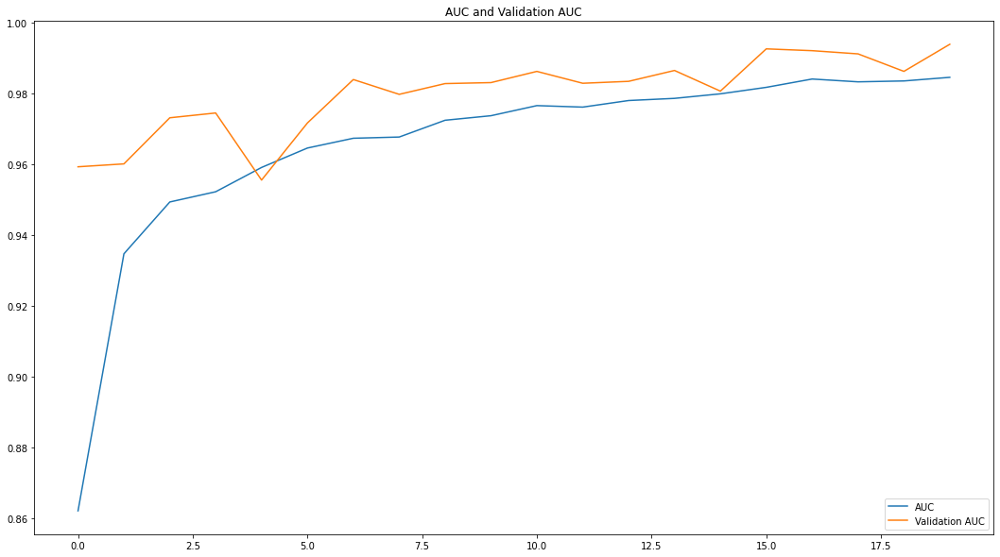

In [28]:
AUC = history['AUC']
val_AUC = history['val_AUC']
 
epochs_range = list(range(len((val_AUC))))
 
plt.figure(figsize=(40, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, AUC, label='AUC')
plt.plot(epochs_range, val_AUC, label='Validation AUC')
plt.legend(loc='lower right')
plt.title('AUC and Validation AUC')


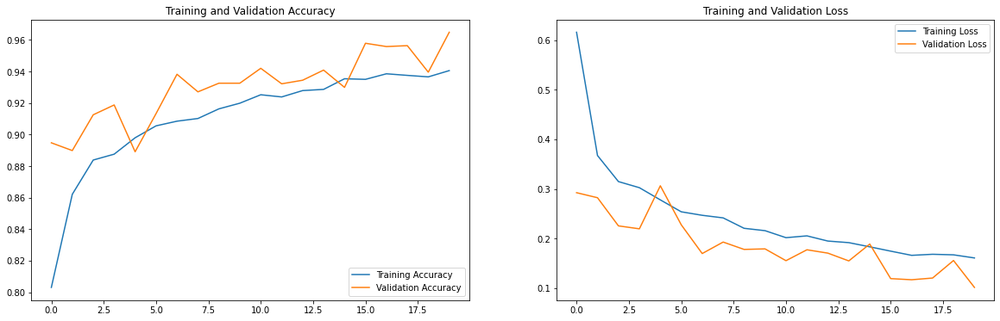

In [29]:
acc = history['accuracy']
val_acc = history['val_accuracy']
 
loss = history['loss']
val_loss = history['val_loss']
 
epochs_range = list(range(len((val_acc))))
 
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')
 
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

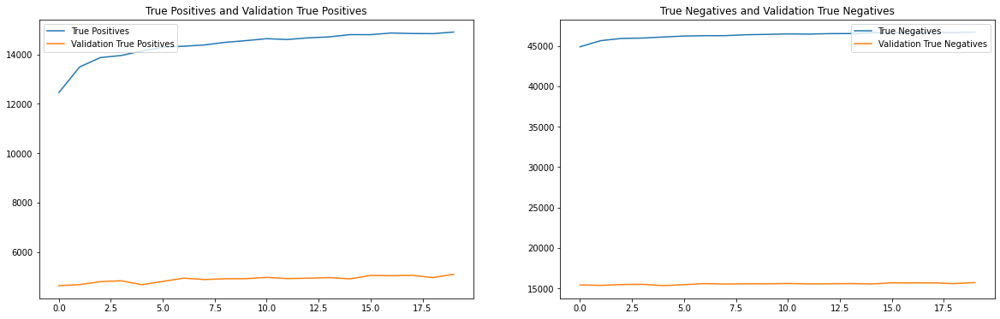

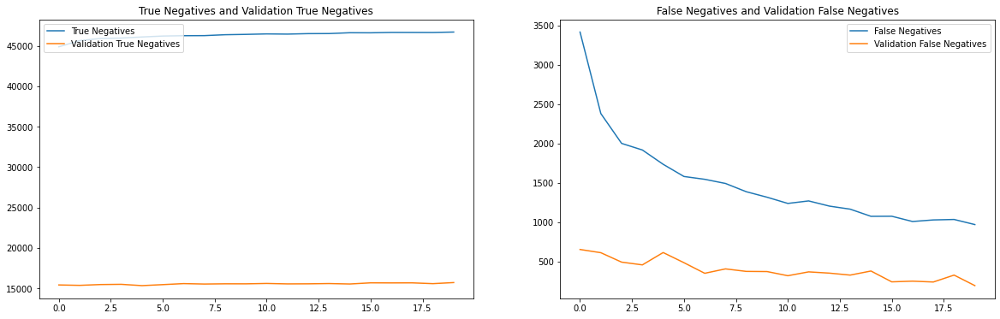

In [30]:
TP = history['TP']
val_TP = history['val_TP']
 
TN = history['TN']
val_TN = history['val_TN']

FP = history['FP']
val_FP = history['val_FP']

FN = history['FN']
val_FN = history['val_FN']
 
epochs_range = list(range(len((val_acc))))
 
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, TP, label='True Positives')
plt.plot(epochs_range, val_TP, label='Validation True Positives')
plt.legend(loc='upper left')
plt.title('True Positives and Validation True Positives')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, TN, label='True Negatives')
plt.plot(epochs_range, val_TN, label='Validation True Negatives')
plt.legend(loc='upper right')
plt.title('True Negatives and Validation True Negatives')
plt.show()

plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, TN, label='True Negatives')
plt.plot(epochs_range, val_TN, label='Validation True Negatives')
plt.legend(loc='upper left')
plt.title('True Negatives and Validation True Negatives')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, FN, label='False Negatives')
plt.plot(epochs_range, val_FN, label='Validation False Negatives')
plt.legend(loc='upper right')
plt.title('False Negatives and Validation False Negatives')
plt.show()

In [31]:
print("Accuracy: ",round(history['accuracy'][-1]*100, 2),"%")
print("Validation Accuracy: ",round(history['val_accuracy'][-1]*100, 2),"%")
print("Loss: ",history['loss'][-1])
print("Validation Loss: ",history['val_loss'][-1])


print("True Positives: ",history['TP'][-1])
print("True Negatives: ",history['TN'][-1])
print("Validation True Positives: ", history['val_TP'][-1])
print("Validation True Negatives: ", history['val_TN'][-1])

print("False Positives: ",history['FP'][-1])
print("False Negatives: ",history['FN'][-1])
print("Validation False Positives: ",history['val_FP'][-1])
print("Validation False Negatives: ",history['val_FN'][-1])


print("AUC: ",round(history['AUC'][-1]*100, 2),"%")
print("Validation AUC: ",round(history['val_AUC'][-1]*100, 2),"%")

Accuracy:  94.05 %
Validation Accuracy:  96.49 %
Loss:  0.16093188524246216
Validation Loss:  0.10151264071464539
True Positives:  14905.0
True Negatives:  46718.0
Validation True Positives:  5101.0
Validation True Negatives:  15696.0
False Positives:  901.0
False Negatives:  968.0
Validation False Positives:  180.0
Validation False Negatives:  191.0
AUC:  98.45 %
Validation AUC:  99.39 %


# Evaluate the Model

In [32]:
model = tf.keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/Models/DenseNet201/DenseNet201.hdf5')

In [33]:
# !wget --no-check-certificate \
#     https://github.com/abdo-projects/data-science-portfolio/raw/main/Dataset/testing_data_xray_short.zip \
#     -O /tmp/testing_data.zip

In [34]:
# local_zip = '/tmp/testing_data.zip'
# zip_ref = zipfile.ZipFile(local_zip, 'r')
# zip_ref.extractall('/content/sample_data/testing_data')

# zip_ref.close()

In [35]:
# Predict classes
#test_data_path = '/content/sample_data/testing_data/testing_data_short'
test_data_path = '/tmp/covid19-radiography-database/COVID-19_Radiography_Dataset'


test_generator = ImageDataGenerator(rescale=1/255)
test_data_generator = test_generator.flow_from_directory(
    test_data_path, # Put your path here
     target_size=(224, 224),
    batch_size=512,
    shuffle=False)
test_steps_per_epoch = np.math.ceil(test_data_generator.samples / test_data_generator.batch_size)

predictions = model.predict(test_data_generator, steps=test_steps_per_epoch)
# Get most likely class
predicted_classes = np.argmax(predictions, axis=1)

Found 21165 images belonging to 4 classes.


In [72]:
predicted_classes

array([0, 1, 0, ..., 3, 3, 3])

In [36]:
#Get ground-truth classes and class-labels

true_classes = test_data_generator.classes
class_labels = list(test_data_generator.class_indices.keys())   
class_labels_values = list(test_data_generator.class_indices.values())

                 precision    recall  f1-score   support

          COVID       0.99      0.94      0.96      3616
   Lung_Opacity       0.94      0.92      0.93      6012
         Normal       0.94      0.97      0.96     10192
Viral Pneumonia       0.98      0.98      0.98      1345

       accuracy                           0.95     21165
      macro avg       0.96      0.95      0.96     21165
   weighted avg       0.95      0.95      0.95     21165



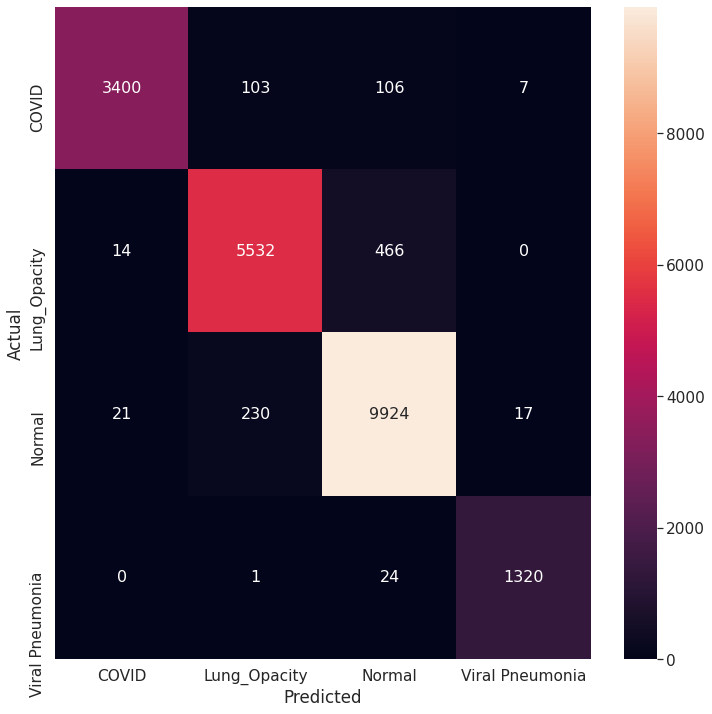

In [38]:
cm=confusion_matrix(true_classes, predicted_classes, labels=class_labels_values)
cm_df=pd.DataFrame(cm, index=class_labels, columns=class_labels)



report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

plt.figure(figsize=(12,12))
sn.set(font_scale=1.4) # for label size
sn.heatmap(cm_df, annot=True, annot_kws={"size": 16}, fmt='g') # font size
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [39]:
class_name_lookup = {name: index for index, name in test_data_generator.class_indices.items()}

for k, v in class_name_lookup.items():
    print(f"{k:2} : {v}")

 0 : COVID
 1 : Lung_Opacity
 2 : Normal
 3 : Viral Pneumonia


In [85]:
test_image_filenames = []
test_dir = []
test_image_data = []

for i in class_labels:
  test_dir.append(os.path.join(test_data_path, i))
for x in test_dir:
  for img_name in os.listdir(x):
      img = load_img(os.path.join(x, img_name), target_size = (224,224))
      test_image_data.append(img_to_array(img, dtype = 'uint8'))
      test_image_filenames.append(img_name)
print("Test directory object created!")

Test directory object created!


In [41]:
test_pred_classes = [class_name_lookup[i] for i in predicted_classes]
test_true_classes = [class_name_lookup[i] for i in true_classes]


pd.DataFrame({
    "Filename": test_image_filenames,
    "True classes": test_true_classes,
    "Predicted classes": test_pred_classes
    })

,Filename,True classes,Predicted classes
0,COVID-326.png,COVID,COVID
1,COVID-649.png,COVID,Lung_Opacity
2,COVID-3389.png,COVID,COVID
3,COVID-2388.png,COVID,COVID
4,COVID-154.png,COVID,COVID
...,...,...,...
21160,Viral Pneumonia-192.png,Viral Pneumonia,Viral Pneumonia
21161,Viral Pneumonia-540.png,Viral Pneumonia,Viral Pneumonia
21162,Viral Pneumonia-977.png,Viral Pneumonia,Viral Pneumonia
21163,Viral Pneumonia-70.png,Viral Pneumonia,Viral Pneumonia


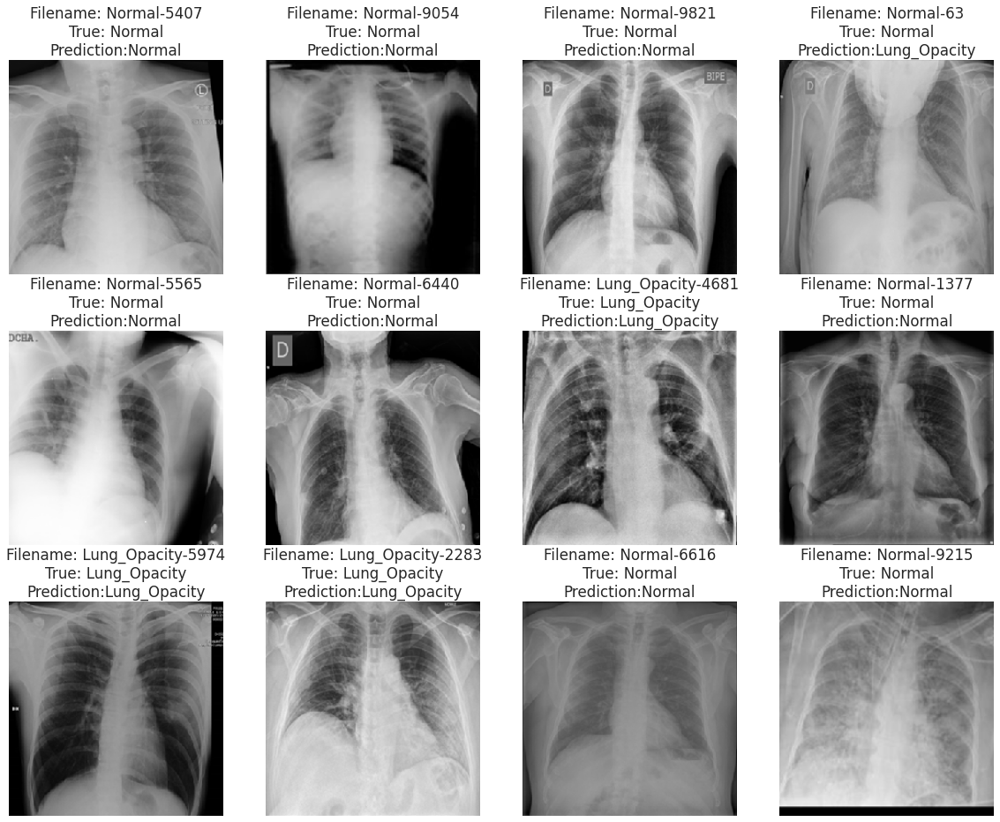

In [42]:
plt.subplots(nrows = 3, ncols = 4, figsize = (20, 16))

for i in range(12):
    random_number = random.randrange(0, len(test_image_filenames))	
    plt.subplot(3, 4, i + 1)
    plt.axis(False)
    plt.grid(False)
    plt.imshow(test_image_data[i])
    plt.title(f"Filename: {test_image_filenames[random_number][:-4]}\nTrue: {test_true_classes[random_number]}\nPrediction:{test_pred_classes[random_number]}")

plt.show()

In [83]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

key = 0

uploaded = files.upload()

for fn in uploaded.keys():
 
  # predicting images
  path = '/content/' + fn
  img = image.load_img(path, target_size=(224, 224))
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)

  images = np.vstack([x])
  classes = list(model.predict(images, batch_size=1))
  flatten_x = np.concatenate(classes)
  print(classes[0])

  dictionary_class = list(train_generator.class_indices.keys())

  for i in range(len(flatten_x)):
    if flatten_x[i] == max(flatten_x):
      break
    else:
     key= key+1
     continue
  print(fn + " is " + dictionary_class[key])


Saving download.png to download.png
[1. 0. 0. 0.]
download.png is COVID
